In [30]:
import os
import numpy as np
import xml.etree.ElementTree as ET
from collections import OrderedDict
import matplotlib.pyplot as plt
import pandas as pd
import glob
import io
from collections import namedtuple
from PIL import Image
import tensorflow as tf

In [2]:
def extract_single_xml_file(tree):
    Nobj = 0
    row  = OrderedDict()
    for elems in tree.iter():

        if elems.tag == "size":
            for elem in elems:
                row[elem.tag] = int(elem.text)
        if elems.tag == "object":
            for elem in elems:
                if elem.tag == "name":
                    row["bbx_{}_{}".format(Nobj,elem.tag)] = str(elem.text)              
                if elem.tag == "bndbox":
                    for k in elem:
                        row["bbx_{}_{}".format(Nobj,k.tag)] = float(k.text)
                    Nobj += 1
    row["Nobj"] = Nobj
    return(row)

In [6]:
df_anno = []
dir_anno = "./Annotations"
for fnm in os.listdir(dir_anno):  
    if not fnm.startswith('.') and not fnm == 'desktop.ini': ## do not include hidden folders/files
        
        tree = ET.parse(os.path.join(dir_anno,fnm))
        row = extract_single_xml_file(tree)
        row["fileID"] = fnm.split(".")[0]
        df_anno.append(row)
df_anno = pd.DataFrame(df_anno)

maxNobj = np.max(df_anno["Nobj"])


print("columns in df_anno\n-----------------")
for icol, colnm in enumerate(df_anno.columns):
    print("{:3.0f}: {}".format(icol,colnm))
print("-"*30)
print("df_anno.shape={}=(N frames, N columns)".format(df_anno.shape))

columns in df_anno
-----------------
  0: width
  1: height
  2: depth
  3: bbx_0_name
  4: bbx_0_xmin
  5: bbx_0_ymin
  6: bbx_0_xmax
  7: bbx_0_ymax
  8: Nobj
  9: fileID
 10: bbx_1_name
 11: bbx_1_xmin
 12: bbx_1_ymin
 13: bbx_1_xmax
 14: bbx_1_ymax
 15: bbx_2_name
 16: bbx_2_xmin
 17: bbx_2_ymin
 18: bbx_2_xmax
 19: bbx_2_ymax
------------------------------
df_anno.shape=(679, 20)=(N frames, N columns)


In [7]:
df_anno.head(20)

,width,height,depth,bbx_0_name,bbx_0_xmin,bbx_0_ymin,bbx_0_xmax,bbx_0_ymax,Nobj,fileID,bbx_1_name,bbx_1_xmin,bbx_1_ymin,bbx_1_xmax,bbx_1_ymax,bbx_2_name,bbx_2_xmin,bbx_2_ymin,bbx_2_xmax,bbx_2_ymax
0,300,300,3,basantapur tower,3.0,89.0,272.0,297.0,1,basantapur_tower (1),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,300,300,3,basantapur tower,52.0,69.0,239.0,244.0,1,basantapur_tower (10),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,300,300,3,basantapur tower,23.0,53.0,254.0,295.0,1,basantapur_tower (100),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,300,300,3,basantapur tower,30.0,68.0,143.0,287.0,1,basantapur_tower (11),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,300,300,3,basantapur tower,26.0,1.0,139.0,251.0,1,basantapur_tower (12),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,300,300,3,basantapur tower,47.0,44.0,235.0,221.0,1,basantapur_tower (13),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,300,300,3,basantapur tower,50.0,53.0,233.0,231.0,1,basantapur_tower (14),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,300,300,3,basantapur tower,34.0,38.0,249.0,260.0,1,basantapur_tower (15),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,300,300,3,basantapur tower,24.0,93.0,223.0,296.0,1,basantapur_tower (16),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,300,300,3,basantapur tower,47.0,23.0,245.0,252.0,1,basantapur_tower (17),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Visualize randomly selected frames with annotations

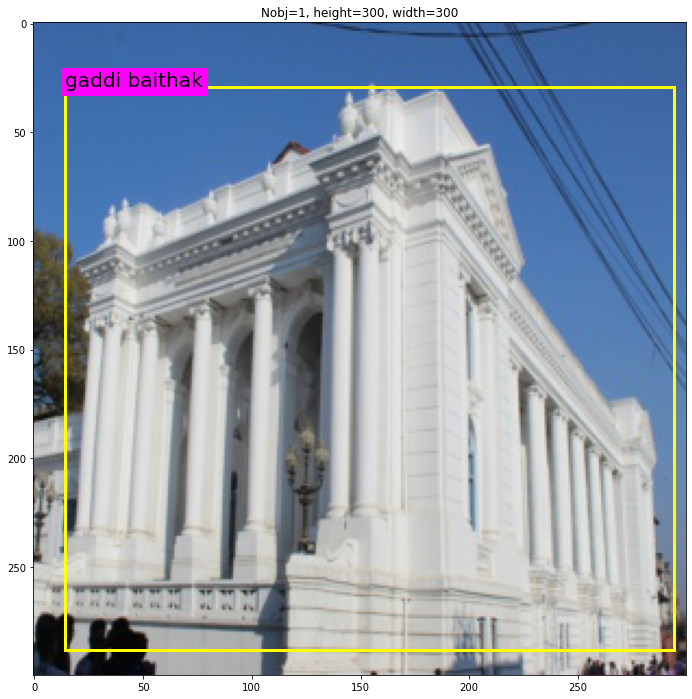

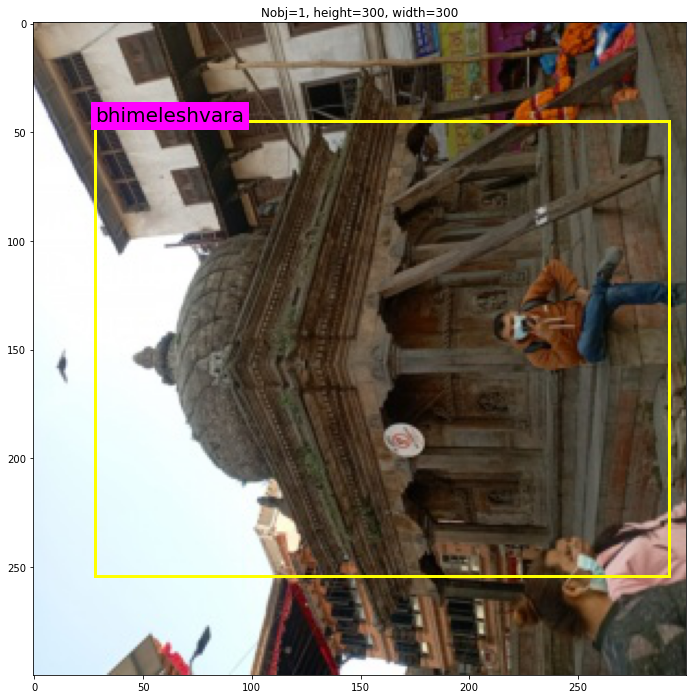

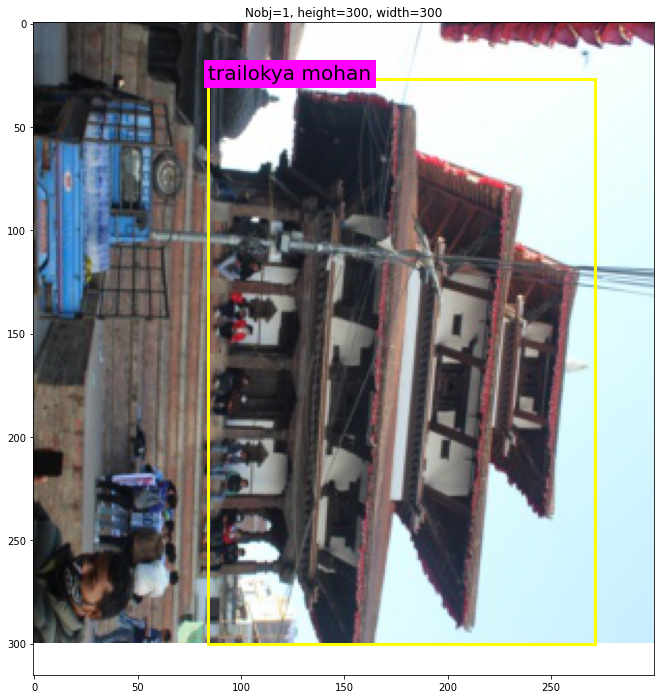

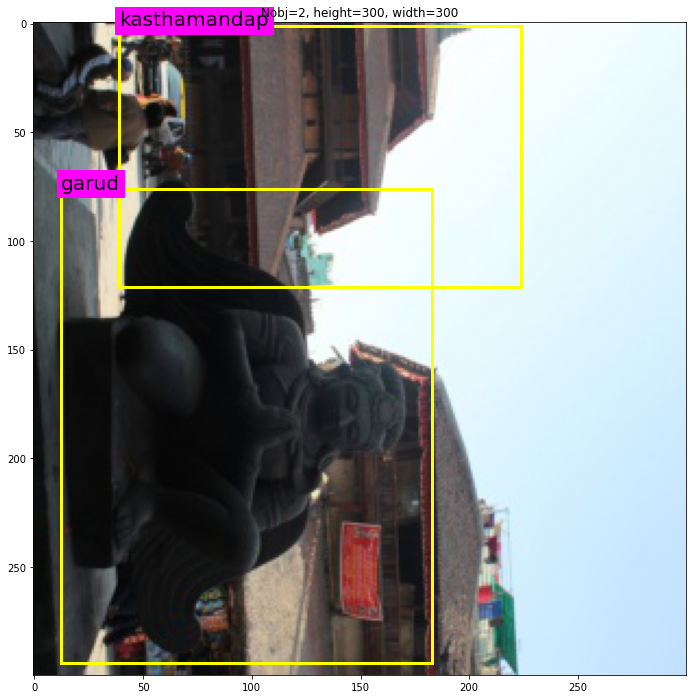

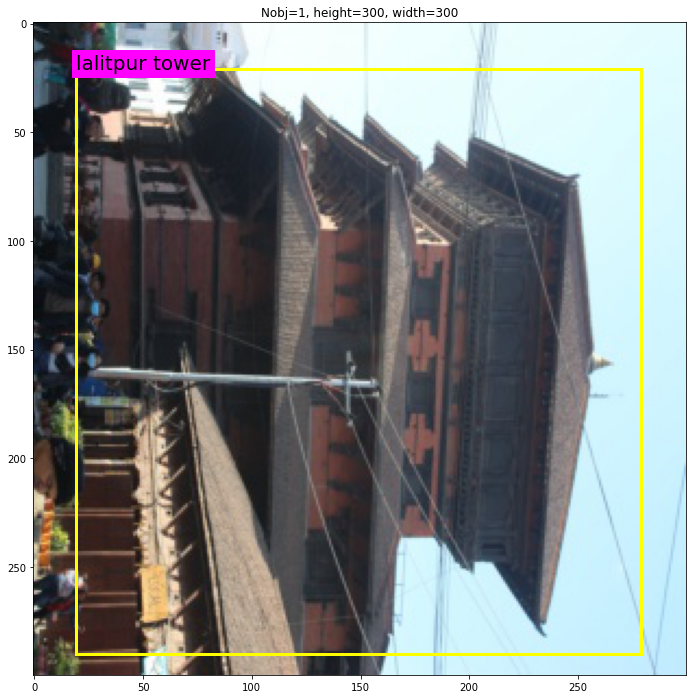

...

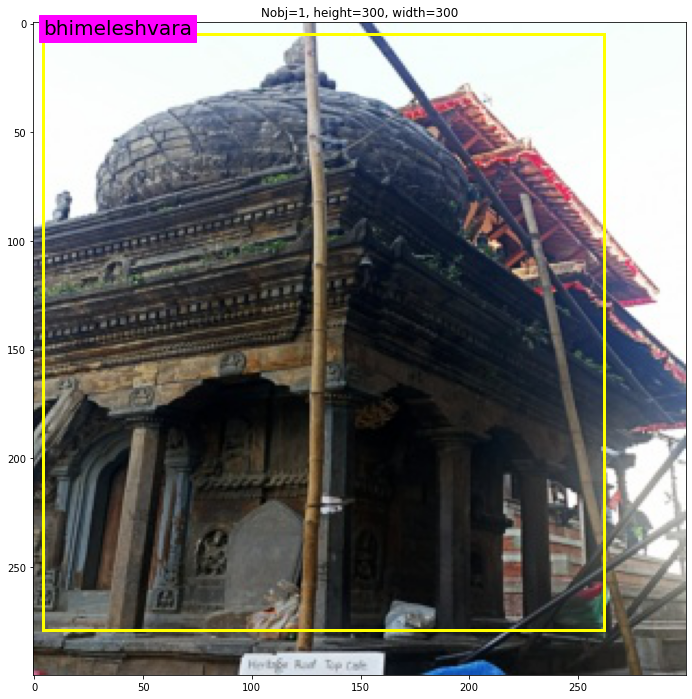

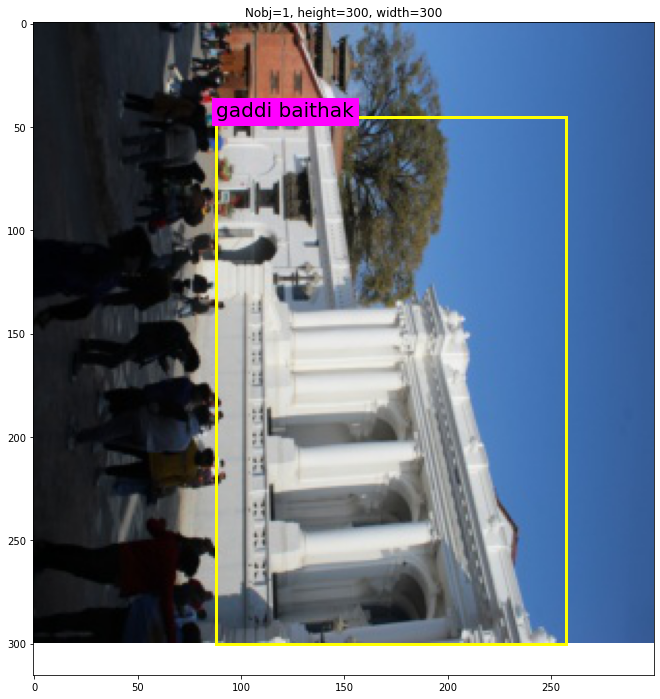

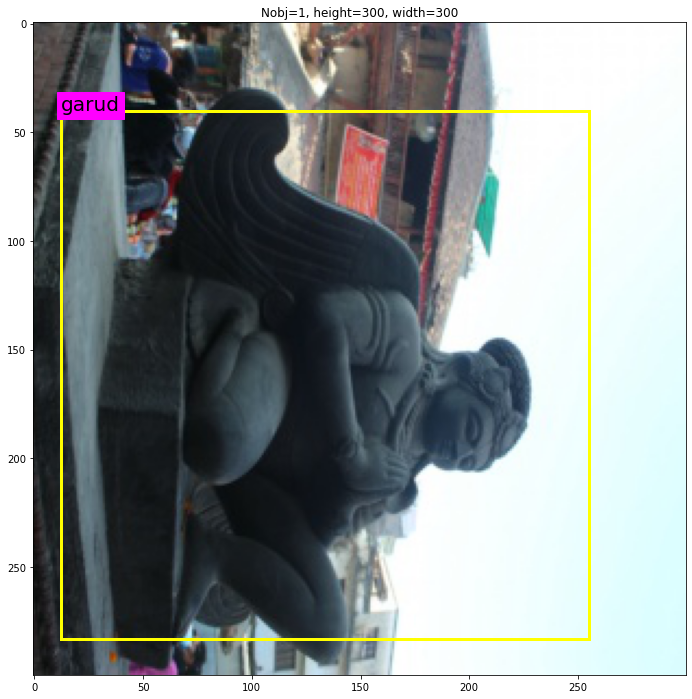

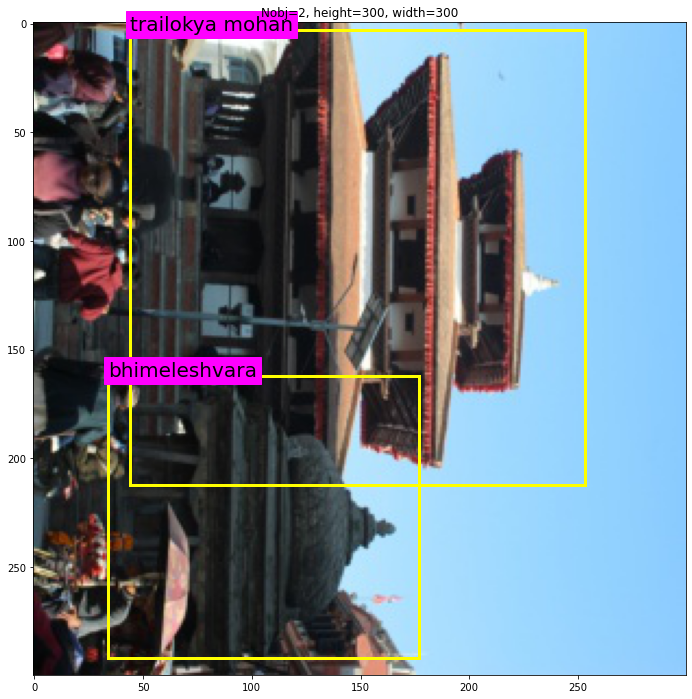

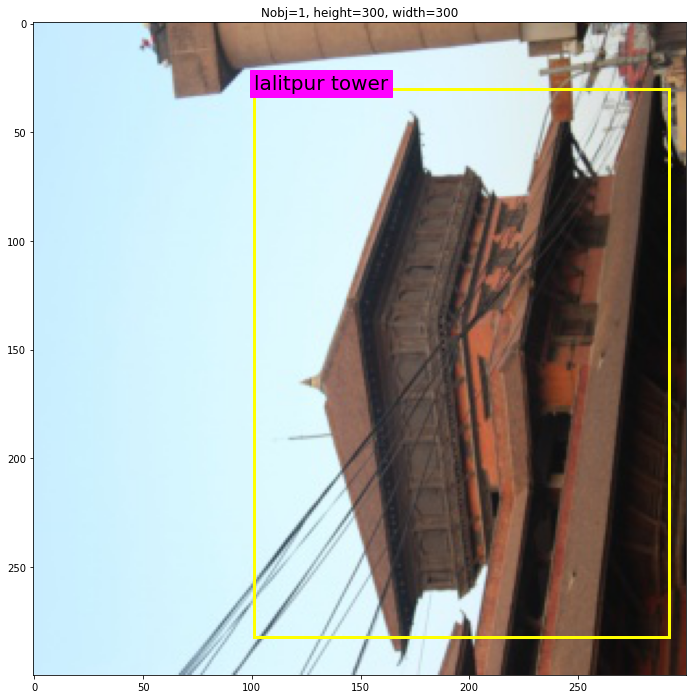

In [8]:
import imageio
def plt_rectangle(plt,label,x1,y1,x2,y2):
    '''
    == Input ==
    
    plt   : matplotlib.pyplot object
    label : string containing the object class name
    x1    : top left corner x coordinate
    y1    : top left corner y coordinate
    x2    : bottom right corner x coordinate
    y2    : bottom right corner y coordinate
    '''
    linewidth = 3
    color = "yellow"
    plt.text(x1,y1,label,fontsize=20,backgroundcolor="magenta")
    plt.plot([x1,x1],[y1,y2], linewidth=linewidth,color=color)
    plt.plot([x2,x2],[y1,y2], linewidth=linewidth,color=color)
    plt.plot([x1,x2],[y1,y1], linewidth=linewidth,color=color)
    plt.plot([x1,x2],[y2,y2], linewidth=linewidth,color=color)
    
# randomly select 20 frames    
size = 20    
img_dir = './JPEGImages'
ind_random = np.random.randint(0,df_anno.shape[0],size=size)
for irow in ind_random:
    row  = df_anno.iloc[irow,:]
    path = os.path.join(img_dir, row["fileID"] + ".jpg")
    # read in image
    img  = imageio.imread(path)

    plt.figure(figsize=(12,12))
    plt.imshow(img) # plot image
    plt.title("Nobj={}, height={}, width={}".format(row["Nobj"],row["height"],row["width"]))
    # for each object in the image, plot the bounding box
    for iplot in range(row["Nobj"]):
        plt_rectangle(plt,
                      label = row["bbx_{}_name".format(iplot)],
                      x1=row["bbx_{}_xmin".format(iplot)],
                      y1=row["bbx_{}_ymin".format(iplot)],
                      x2=row["bbx_{}_xmax".format(iplot)],
                      y2=row["bbx_{}_ymax".format(iplot)])
    plt.show() ## show the plot

In [12]:
def xml_to_csv(path):
    """Iterates through all .xml files (generated by labelImg) in a given directory and combines
    them in a single Pandas dataframe.

    Parameters:
    ----------
    path : str
        The path containing the .xml files
    Returns
    -------
    Pandas DataFrame
        The produced dataframe
    """

    xml_list = []
    for xml_file in glob.glob(path + '/*.xml'):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for member in root.findall('object'):
            value = (root.find('filename').text,
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),
                     member[0].text,
                     int(member[4][0].text),
                     int(member[4][1].text),
                     int(member[4][2].text),
                     int(member[4][3].text)
                     )
            xml_list.append(value)
    column_name = ['filename', 'width', 'height',
                   'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
   # xml_df.to_csv('./xml_to_csv_file.csv')
    return xml_df
#xml_to_csv('./Annotations')

In [14]:
def split(df, group):
    data = namedtuple('data', ['filename', 'object'])
    gb = df.groupby(group)
    return [data(filename, gb.get_group(x)) for filename, x in zip(gb.groups.keys(), gb.groups)]

In [17]:
def int64_feature(value):
    return tf.train.Feature(int64_list=tf.train.Int64List(value=[value]))
def bytes_feature(value):
    return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))
def float_list_feature(value):
    return tf.train.Feature(float_list=tf.train.FloatList(value=value))
def bytes_list_feature(value):
    return tf.train.Feature(bytes_list=tf.train.BytesList(value=value))
def int64_list_feature(value):
    return tf.train.Feature(int64_list=tf.train.Int64List(value=value))

In [46]:
def class_text_to_int(row_label):
    label_map_dict = {
        'basantapur tower': 1,
        'bhimeleshvara': 2,
        'gaddi baithak' : 3,
        'garud' : 4, 
        'kasthamandap' : 5,
        'lalitpur tower': 6,
        'trailokya mohan':7
    }
    return label_map_dict[row_label]

In [47]:
def create_tf_example(group, path):
    with tf.io.gfile.GFile(os.path.join(path, '{}'.format(group.filename)), 'rb') as fid:
        encoded_jpg = fid.read()
    encoded_jpg_io = io.BytesIO(encoded_jpg)
    image = Image.open(encoded_jpg_io)
    width, height = image.size

    filename = group.filename.encode('utf8')
    image_format = b'jpg'
    xmins = []
    xmaxs = []
    ymins = []
    ymaxs = []
    classes_text = []
    classes = []

    for index, row in group.object.iterrows():
        xmins.append(row['xmin'] / width)
        xmaxs.append(row['xmax'] / width)
        ymins.append(row['ymin'] / height)
        ymaxs.append(row['ymax'] / height)
        classes_text.append(row['class'].encode('utf8'))
        classes.append(class_text_to_int(row['class']))

    tf_example = tf.train.Example(features=tf.train.Features(feature={
        'image/height': int64_feature(height),
        'image/width': int64_feature(width),
        'image/filename': bytes_feature(filename),
        'image/source_id': bytes_feature(filename),
        'image/encoded': bytes_feature(encoded_jpg),
        'image/format': bytes_feature(image_format),
        'image/object/bbox/xmin': float_list_feature(xmins),
        'image/object/bbox/xmax': float_list_feature(xmaxs),
        'image/object/bbox/ymin': float_list_feature(ymins),
        'image/object/bbox/ymax': float_list_feature(ymaxs),
        'image/object/class/text': bytes_list_feature(classes_text),
        'image/object/class/label': int64_list_feature(classes),
    }))
    return tf_example

In [60]:
def main():
    writer = tf.io.TFRecordWriter('./dataset.tfrecord')
    path = os.path.join('./JPEGImages')
    examples = xml_to_csv('./Annotations')
    grouped = split(examples, 'filename')
    for group in grouped:
        tf_example = create_tf_example(group, path)
        writer.write(tf_example.SerializeToString())
    writer.close()
    print('Successfully created the TFRecord file: {}'.format('./dataset.tfrecord'))
    examples.to_csv('./dataset.csv', index=None)
    print('Successfully created the CSV file: {}'.format('./dataset.csv'))

In [53]:
main()

Successfully created the TFRecord file: ./dataset.tfrecord
Successfully created the CSV file: ./dataset.csv


In [54]:
dataset = tf.data.TFRecordDataset('./dataset.tfrecord')

In [71]:
for data in dataset:
    print(data.get_shape)
    break

<bound method _EagerTensorBase.get_shape of <tf.Tensor: shape=(), dtype=string, numpy=b'\n\xac\xbe\x02\n\x16\n\x0cimage/height\x12\x06\x1a\x04\n\x02\xac\x02\n\x15\n\x0bimage/width\x12\x06\x1a\x04\n\x02\xac\x02\n+\n\x0eimage/filename\x12\x19\n\x17\n\x15IMG20221219144418.jpg\n,\n\x0fimage/source_id\x12\x19\n\x17\n\x15IMG20221219144418.jpg\n\xed\xba\x02\n\rimage/encoded\x12\xda\xba\x02\n\xd6\xba\x02\n\xd2\xba\x02\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x01,\x01,\x00\x00\xff\xdb\x00C\x00\x02\x01\x01\x01\x01\x01\x02\x01\x01\x01\x02\x02\x02\x02\x02\x04\x03\x02\x02\x02\x02\x05\x04\x04\x03\x04\x06\x05\x06\x06\x06\x05\x06\x06\x06\x07\t\x08\x06\x07\t\x07\x06\x06\x08\x0b\x08\t\n\n\n\n\n\x06\x08\x0b\x0c\x0b\n\x0c\t\n\n\n\xff\xdb\x00C\x01\x02\x02\x02\x02\x02\x02\x05\x03\x03\x05\n\x07\x06\x07\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\xff\xc0\x00\x11\x08\x01,\x01,\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01